# latent semantic analysis

- find synonyms and reduce the dimensionality of the problem
- may need to perfom stemming in 2-tokenisation step

# Load Data

In [1]:
import ast
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
font = {'size'   : 40}
import matplotlib.cm as cm

matplotlib.rc('font', **font)
import seaborn as sns
pd.set_option("display.max_colwidth", 200)

runType='./figures/3-2-lsa-reduced-data-set-extra-stopwords-'

In [2]:
# load tokenized data (nouns)

allData = pd.read_csv('../data/tokenized-data.csv', index_col='index')
for col in allData.columns.tolist():
    allData[col] = allData[col].apply(lambda x: ast.literal_eval(x))

len(allData)

14186

In [3]:
allData.sample(3)

,questionDescription,question,qTopic,answerDescription,option1,option2,option3,option4,option5
index,,,,,,,,,
7748,"[man, ae, altered, consciousness, blood, pressure, skin, pigmented, past, hashimotos, thyroiditis, family, say, tired, several, months, losing, weight, complaining, abdominal, pain]","[results, found, investigation]",[endocrinology],"[serum, sodium, level, part, clinical, picture, suggestive, addisons, hypotension, pigmentation, prodromal, period, symptoms, keeping, glucocorticoid, deficiency, man, another, autoimmune, endocri...","[laboratory, glucose, level]","[serum, sodium, level]","[peaked, waves, ecg]","[serum, potassium, level]","[serum, urea, level]"
3671,"[man, presented, chest, pain, found, st, elevation, leads, ii, iii, avf, thrombolysed, stable, coronary, care, third, day, admission, becomes, confused, reviewing, becomes, apparent, heavy, alcoho...","[management, options, helpful, situation]","[clinical, pharmacology]","[diazepam, man, withdrawing, alcohol, anxiety, tachycardia, last, thing, someone, mi, suffer, risk, seizure, benzidiazepines, first, line, treatment, withdrawal, thiamine, indicated, chronic, alco...","[ct, brain, scan]",[diazepam],[haloperidol],"[psychiatric, referral]",[thiamine]
1444,[part],"[haematological, disorders, inherited, autosomal, recessive, condition]","[basic, science]","[pyruvate, kinase, deficiency, pyruvate, kinase, deficiency, rare, congenital, haemolytic, anaemia, inherited, autosomal, recessive, manner, conditions, inheritance, acute, intermittent, porphyria...","[acute, intermittent, porphyria]","[antithrombin, iii, deficiency]","[pyruvate, kinase, deficiency]","[glucose, phosphate, dehydrogenase, deficiency]","[protein, c, deficiency]"


In [4]:
print(allData.qTopic.value_counts())

[past, paper]               1626
[endocrinology]             1286
[basic, science]            1241
[cardiology]                1120
[neurology]                 1009
[rheumatology]               952
[respiratory]                952
[gastroenterology]           925
[haematology]                912
[nephrology]                 791
[infectious]                 692
[clinical, pharmacology]     664
[psychiatry]                 469
[dermatology]                363
[statistics]                 261
[ophthalmology]              201
[emergency, medicine]        165
[general, revision]          136
[misc]                       132
[tropical, medicine]         119
[pharmacology]                98
[medicine]                    46
[ethics, law]                 26
Name: qTopic, dtype: int64


In [5]:
# need to remove the non-labelled questions
topicsToRemove = ['past paper','misc', 'basic science',
                  'clinical pharmacology', 'emergency medicine',
                  'tropical medicine', 'medicine', 'ethics law',
                  'general revision', 'ophthalmology', 'pharmacology']
allData.qTopic = allData.qTopic.apply(lambda x: ' '.join(x))
questionsToBeLabelled = allData.loc[allData.qTopic.isin(topicsToRemove)]
allDataRevised = allData.loc[~allData.qTopic.isin(topicsToRemove)]

In [6]:
print(len(allDataRevised), len(questionsToBeLabelled))

9732 4454


# Implementing Latent Symantic Analysis using sklearn

- following https://www.analyticsvidhya.com/blog/2018/10/stepwise-guide-topic-modeling-latent-semantic-analysis/

## Data preprocessing
- we have already removed stopwords and non-alphabet characters.
- we need to join up the important columns in the allData df  - omit the question column and answer column
- we can remove words <3 characters too

In [7]:
# join up important columns in dataframe
joinedDf = pd.DataFrame()
joinedDf['text'] = allDataRevised.apply(lambda x: ' '.join(x['questionDescription']+
                                                    x['answerDescription']+
                                                    x['option1']+
                                                    x['option2']+
                                                    x['option3']+
                                                    x['option4']+
                                                    x['option5']), axis=1)
additionalStopWords = [
    'part','blood','normal','treatment','diagnosis','symptoms','cause',
    'blood','man','part','treatment','woman','symptom','cell',
    'syndrome','case','test','infection','level','day','month',
    'drug','investigation','week','cause','present','therapy',
    'pressure','feature','chest','failure','serum','weight'
]
joinedDf['text'] = joinedDf.text.apply(lambda x: ' '.join([
    w for w in x.split() if len(w)>3 and w not in additionalStopWords
]))
joinedDf['topic'] = allDataRevised.qTopic
joinedDf.sample(2)

,text,topic
index,,
9437,lady polyarthralgia eyes grade fever tender joints demonstrable synovitis results rheumatoid factor anti dsdna anti antibodies systemic lupus erythematosus systemic lupus erythematosus account ant...,rheumatology
11120,delayed developmental milestones problems impulse control special education classes schooling mild mental retardation suggest mild mental retardation usually idiopathic clear physical social patho...,psychiatry


In [8]:
joinedDf.topic.value_counts()

endocrinology       1286
cardiology          1120
neurology           1009
respiratory          952
rheumatology         952
gastroenterology     925
haematology          912
nephrology           791
infectious           692
psychiatry           469
dermatology          363
statistics           261
Name: topic, dtype: int64

- let's see if we can add any additional stopwords

## Document-term matrix

- can use two types of vectorizer - count (BoW and tf-idf)

In [9]:
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer
from sklearn.decomposition import TruncatedSVD


In [10]:
## Bag of Words embedding

bowVectoriser = CountVectorizer(stop_words=None,
                               max_features=500,
                               max_df = 0.5)
bowX = bowVectoriser.fit_transform(joinedDf['text'])

# SVD represent documents and terms in vectors 
svd_model_bow = TruncatedSVD(n_components=21, algorithm='randomized', n_iter=100, random_state=122)
svd_model_bow.fit(bowX)

TruncatedSVD(algorithm='randomized', n_components=21, n_iter=100,
             random_state=122, tol=0.0)

In [11]:
## TF-IDF embedding

tfIdfVectorizer = TfidfVectorizer(stop_words=None, 
                                 max_features= 500, # keep top 1000 terms 
                                 max_df = 0.5, 
                                 smooth_idf=True)
tfIdfX = tfIdfVectorizer.fit_transform(joinedDf['text'])

# SVD represent documents and terms in vectors 
svd_model_tfIdf = TruncatedSVD(n_components=21, algorithm='randomized', n_iter=100, random_state=122)
svd_model_tfIdf.fit(tfIdfX)

TruncatedSVD(algorithm='randomized', n_components=21, n_iter=100,
             random_state=122, tol=0.0)

In [12]:
terms = tfIdfVectorizer.get_feature_names()

for i, comp in enumerate(svd_model_bow.components_):
    terms_comp = zip(terms, comp)
    sorted_terms = sorted(terms_comp, key= lambda x:x[1], reverse=True)[:10]
    print("Topic "+str(i)+": ")
    sum_terms = sum([ii[1] for ii in sorted_terms])
    for t in sorted_terms:
        print(t[0], round(100*t[1]/sum_terms,2) )
    print(" ")

Topic 0: 
renal 15.09
pain 13.59
left 10.49
acute 10.41
right 9.92
usually 9.07
risk 8.65
chronic 7.7
arthritis 7.62
pulmonary 7.47
 
Topic 1: 
left 22.34
right 20.94
pain 11.12
nerve 10.26
arthritis 8.64
artery 8.06
weakness 6.13
joint 4.26
pulmonary 4.14
loss 4.11
 
Topic 2: 
arthritis 25.71
rheumatoid 15.38
pain 10.2
joint 9.6
anti 8.57
positive 7.67
antibodies 6.89
joints 6.04
factor 5.05
fever 4.91
 
Topic 3: 
glucose 18.77
insulin 15.22
risk 15.04
diabetes 14.64
type 7.91
increased 6.07
oral 5.93
levels 5.65
fasting 5.57
high 5.19
 
Topic 4: 
glucose 14.62
arthritis 14.41
diabetes 13.19
insulin 11.58
renal 9.5
pain 9.16
type 9.05
rheumatoid 7.16
joint 6.63
nerve 4.7
 
Topic 5: 
arthritis 16.67
pulmonary 15.15
rheumatoid 11.59
risk 11.05
anti 10.01
heart 8.96
antibodies 7.8
positive 6.64
hypertension 6.15
systemic 5.98
 
Topic 6: 
pain 26.81
risk 22.91
acute 9.76
arthritis 7.5
joint 6.18
increased 6.14
rate 5.86
severe 5.18
heart 4.93
bone 4.72
 
Topic 7: 
risk 26.42
cancer 10.94


In [13]:
# 2 dimensional plot

import umap.umap_ as umap

X_topics = svd_model_tfIdf.fit_transform(tfIdfX)
embedding = umap.UMAP(n_neighbors=150, min_dist=0.1, random_state=12).fit_transform(X_topics)

C:\ProgramData\Anaconda3\lib\site-packages\numba\compiler.py:602: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "..\..\..\..\..\..\ProgramData\Anaconda3\lib\site-packages\umap\rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  self.func_ir.loc))
C:\ProgramData\Anaconda3\lib\site-packages\numba\compiler.py:602: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "..\..\..\..\..\..\ProgramData\Anaconda3\lib\site-packages\umap\rp_tree.

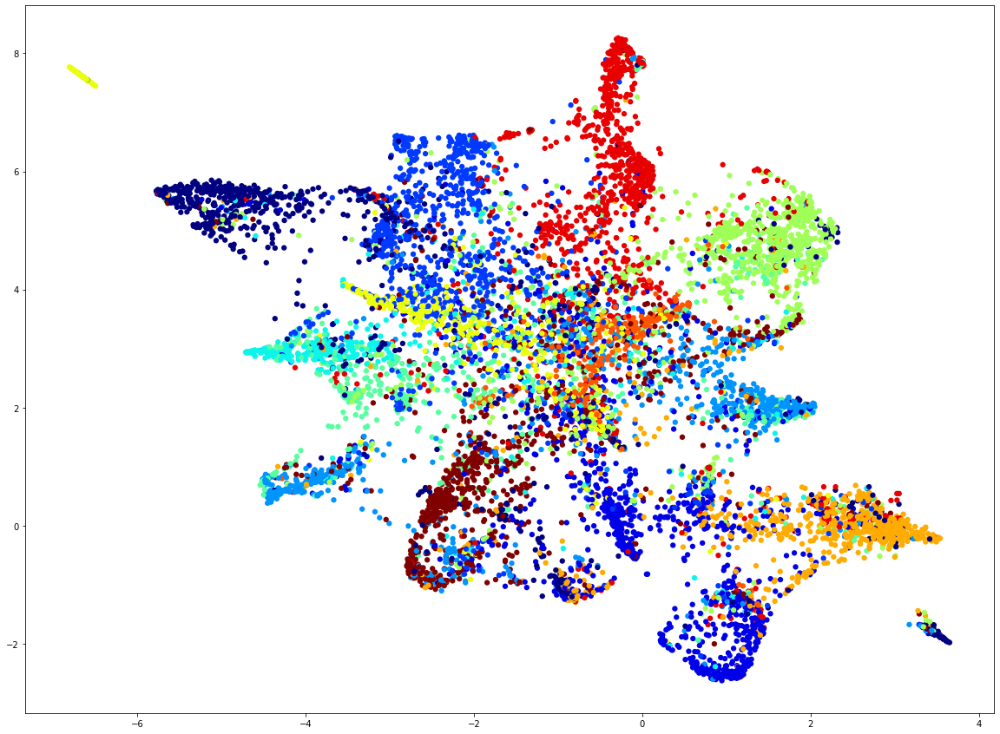

In [14]:
topics = list(set(joinedDf.topic.tolist()))
topicsDict = {}
for i in range(0, len(topics)):
    topicsDict[topics[i]]=i
joinedDf['target']=joinedDf['topic'].map(topicsDict)

fig= plt.figure(figsize=(20,15))
plt.scatter(embedding[:, 0], embedding[:, 1],  
            c =  joinedDf.target.tolist() ,
            s = 40, # size
            edgecolor='none', cmap='jet_r'
)
plt.show()

In [15]:
# 3 dimensional plot

# 2 dimensional plot

import umap.umap_ as umap

X_topics = svd_model_tfIdf.fit_transform(tfIdfX)
embedding = umap.UMAP(n_neighbors=150, min_dist=0.1, random_state=12, n_components=3).fit_transform(X_topics)

C:\ProgramData\Anaconda3\lib\site-packages\numba\compiler.py:602: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "..\..\..\..\..\..\ProgramData\Anaconda3\lib\site-packages\umap\nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))


In [16]:
embedding.shape

(9732, 3)

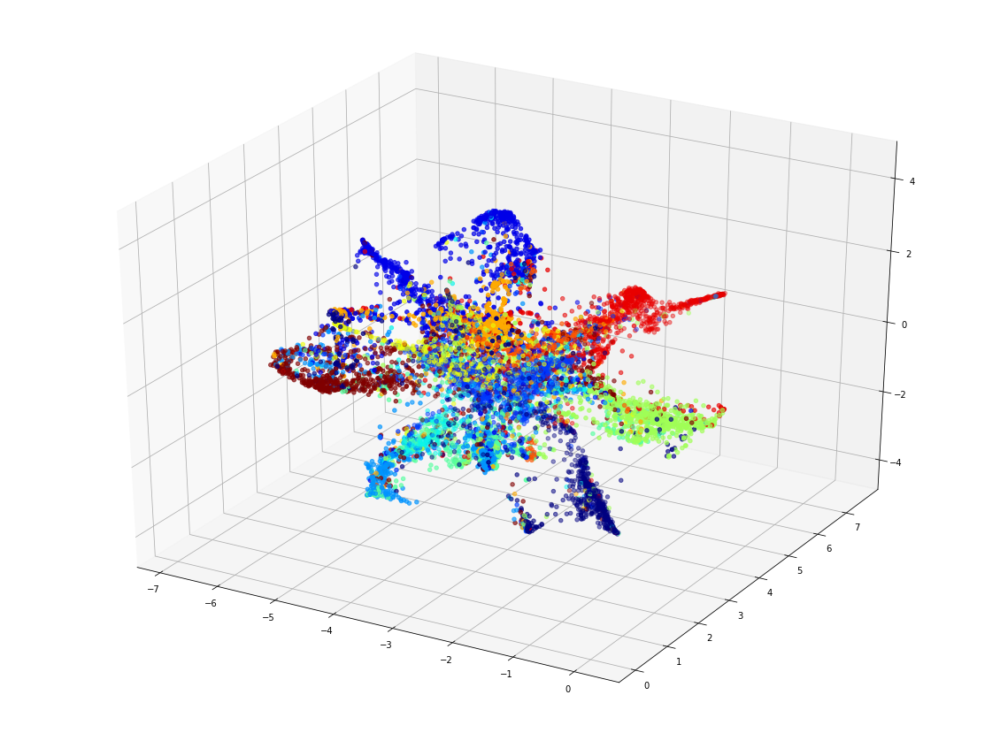

In [17]:
from mpl_toolkits.mplot3d import Axes3D
topics = list(set(joinedDf.topic.tolist()))
topicsDict = {}
for i in range(0, len(topics)):
    topicsDict[topics[i]]=i
joinedDf['target']=joinedDf['topic'].map(topicsDict)

fig = plt.figure(figsize=(20,15))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(embedding[:, 0], embedding[:, 1], embedding[:, 2]
            , c =  joinedDf.target.tolist()
#             , s = 40, # size
           ,cmap='jet_r'
)
plt.show()
# plt.scatter

In [18]:
umap3dData = pd.DataFrame()
umap3dData['x'] = embedding[:, 0]
umap3dData['y'] = embedding[:, 1]
umap3dData['z'] = embedding[:, 2]
umap3dData['topic'] = joinedDf.topic.tolist()

In [19]:
import plotly.express as px
import plotly.graph_objects as go

In [20]:
import plotly.express as px
fig = px.scatter_3d(umap3dData, x='x', y='y', z='z',
              color='topic', opacity=0.5, size_max=1, color_continuous_scale='Jet')
fig.show()

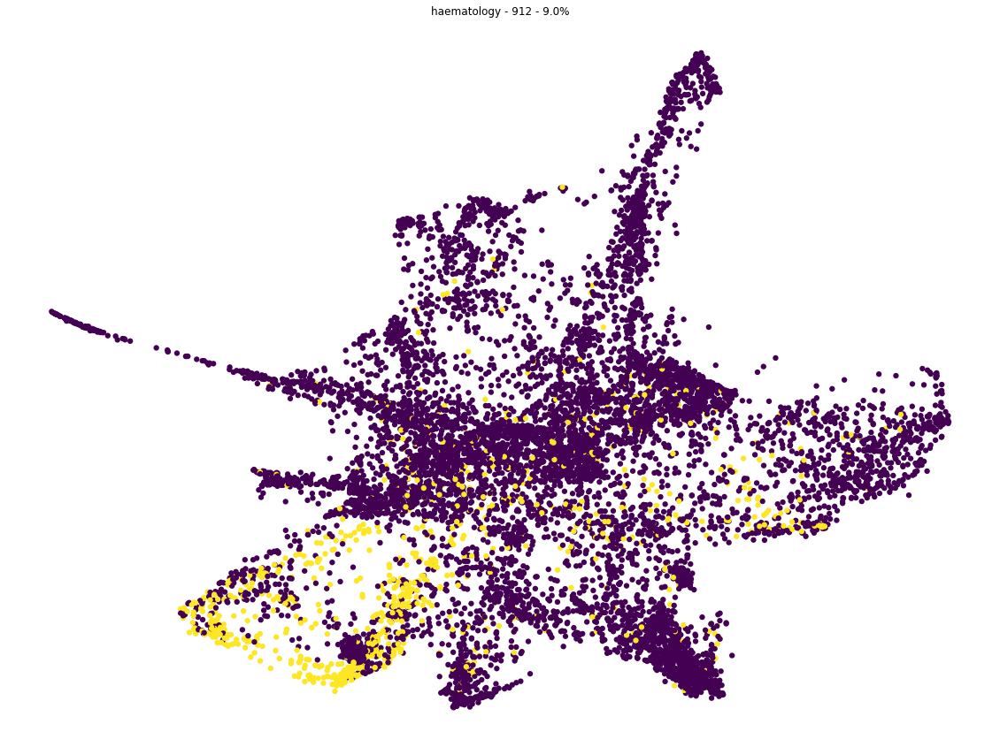

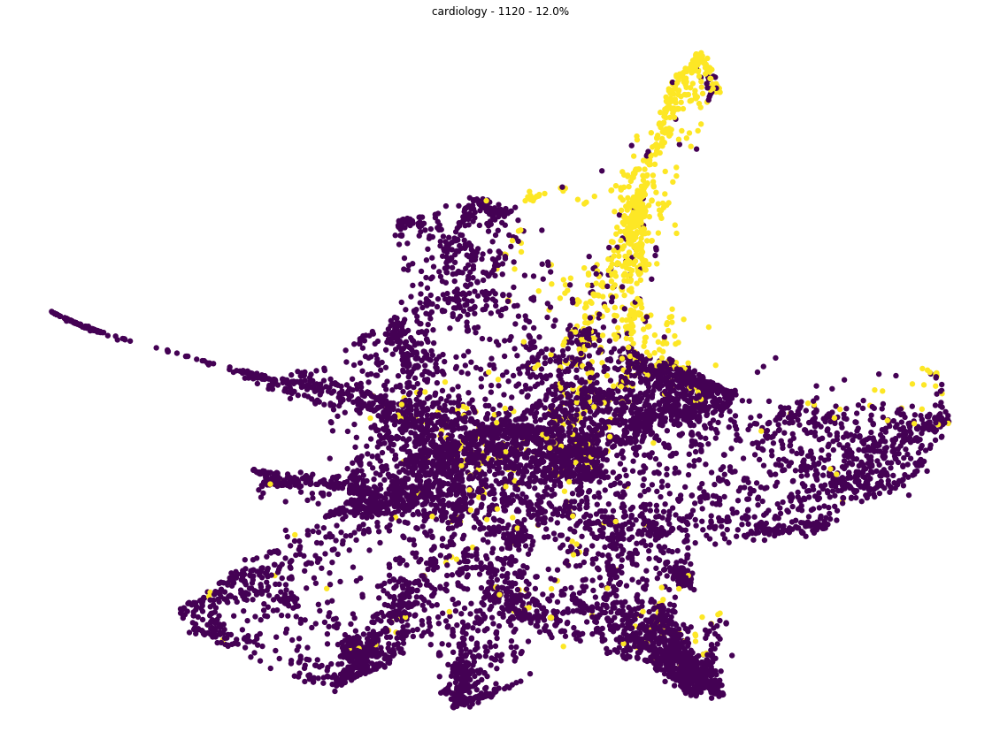

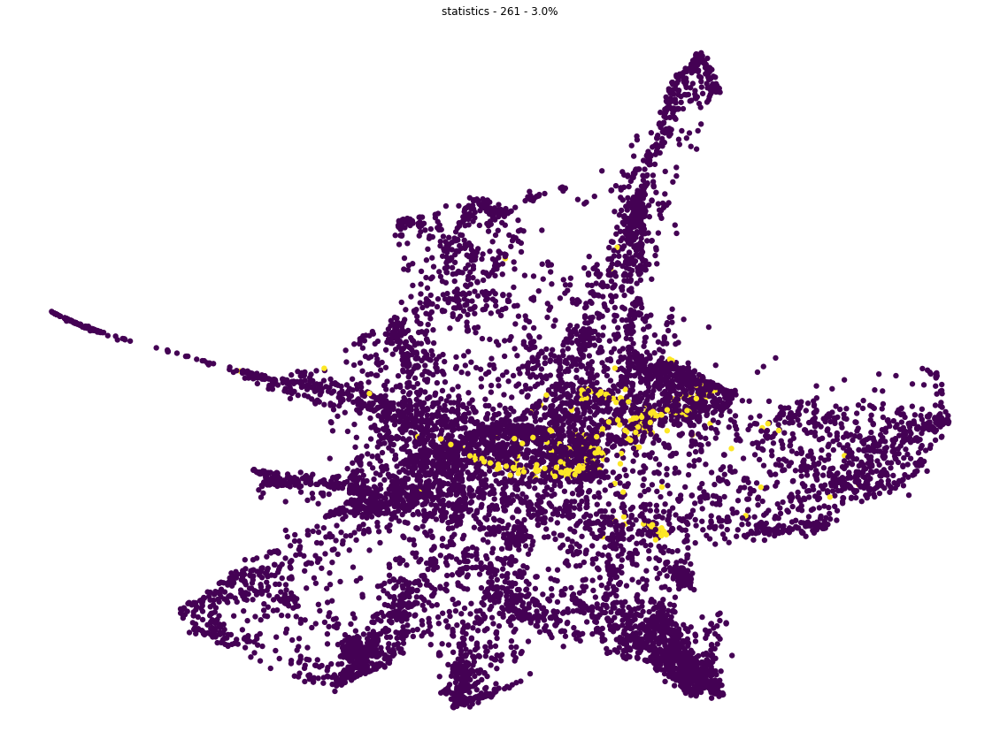

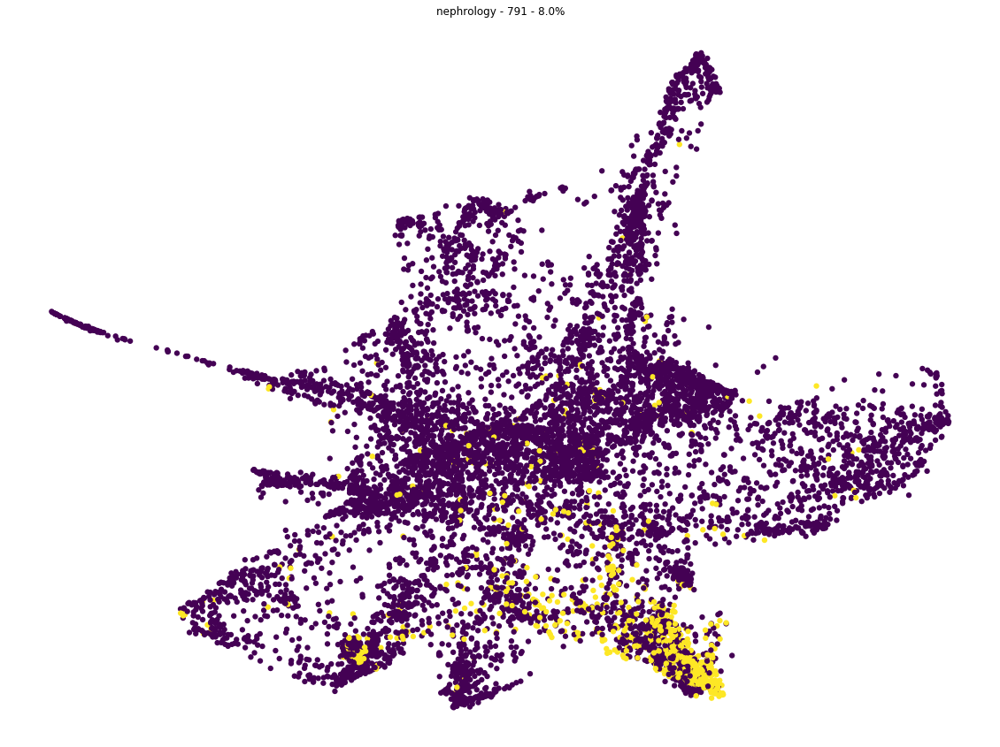

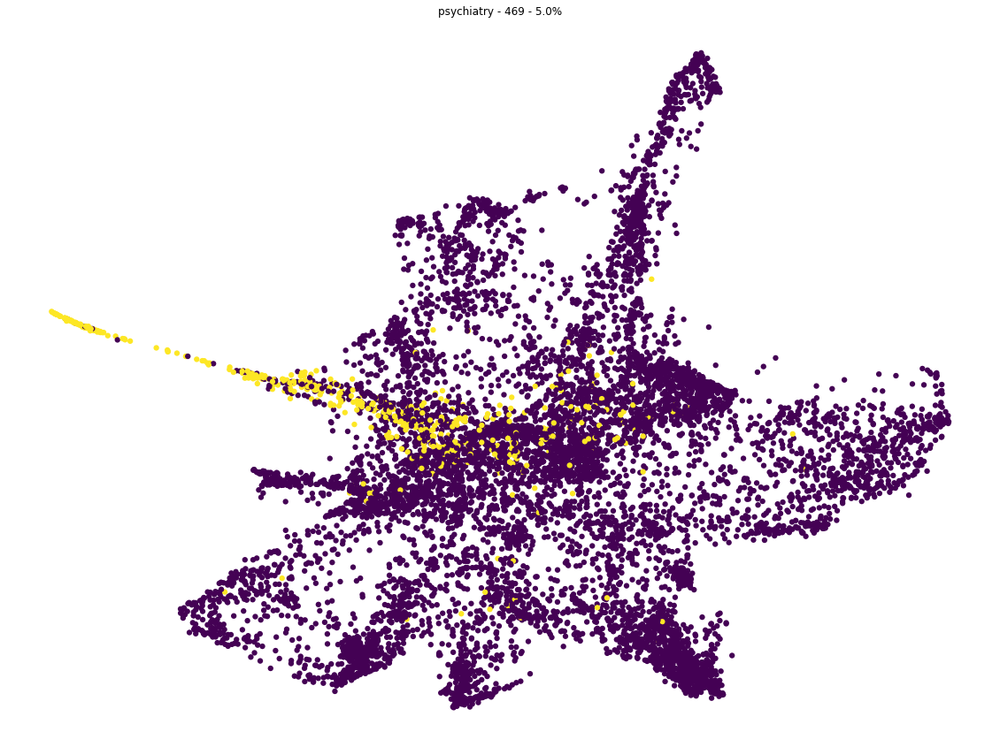

...

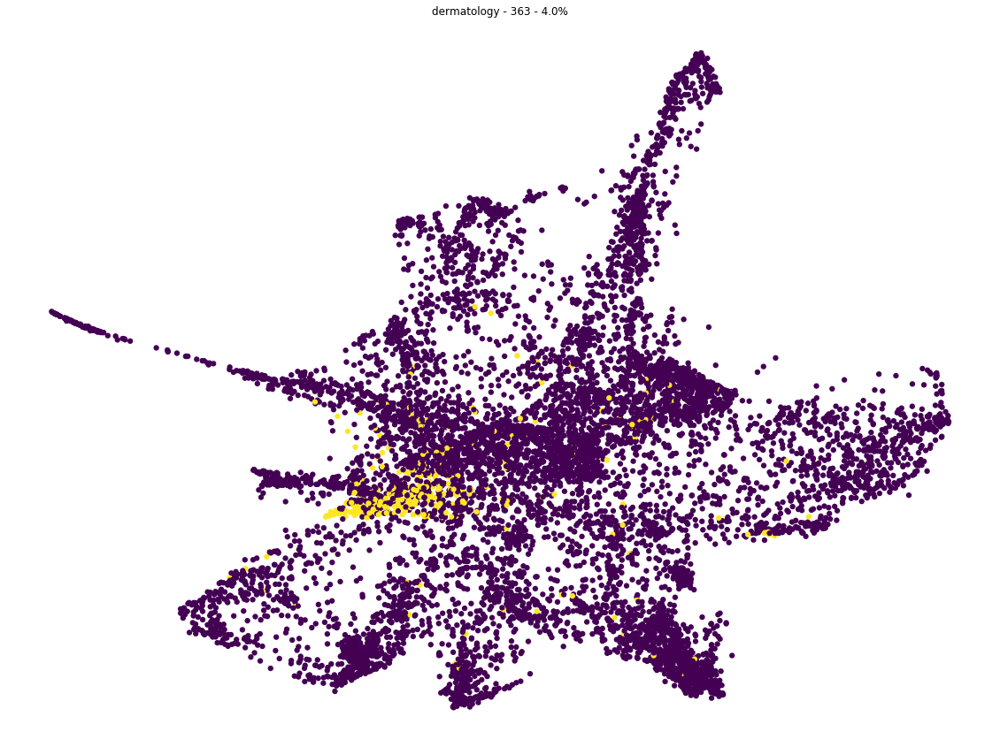

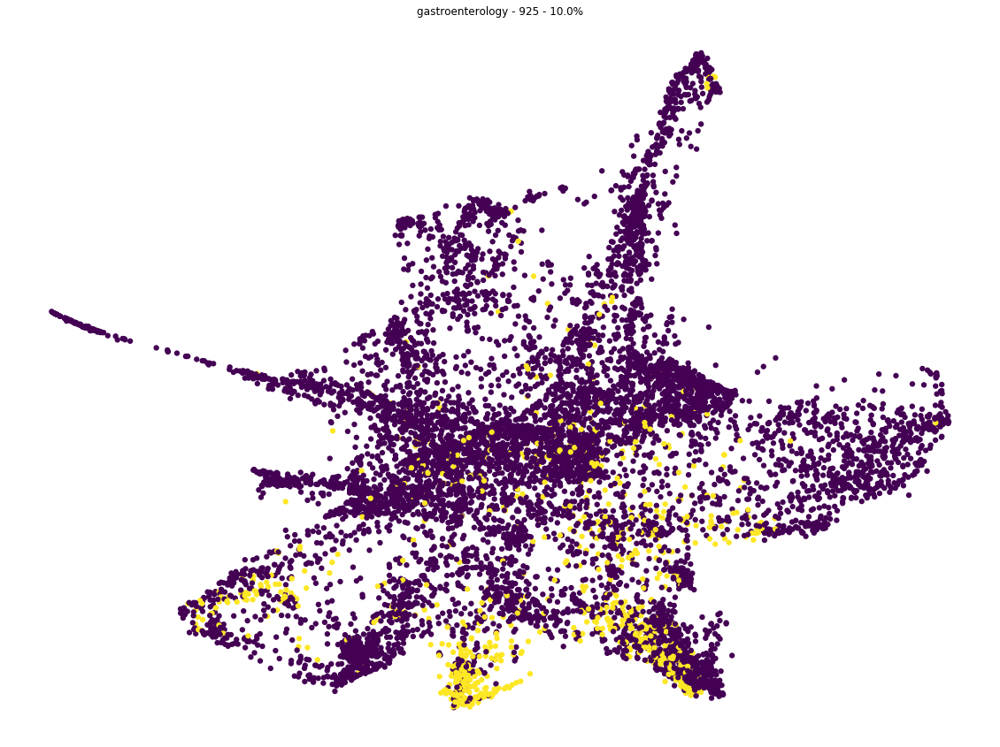

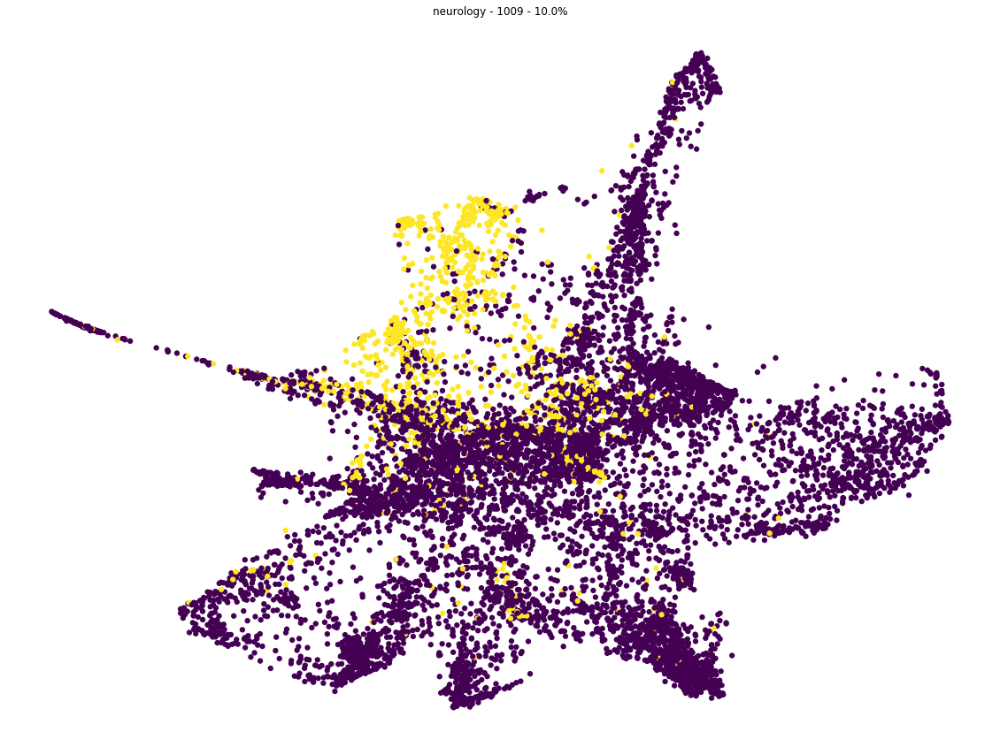

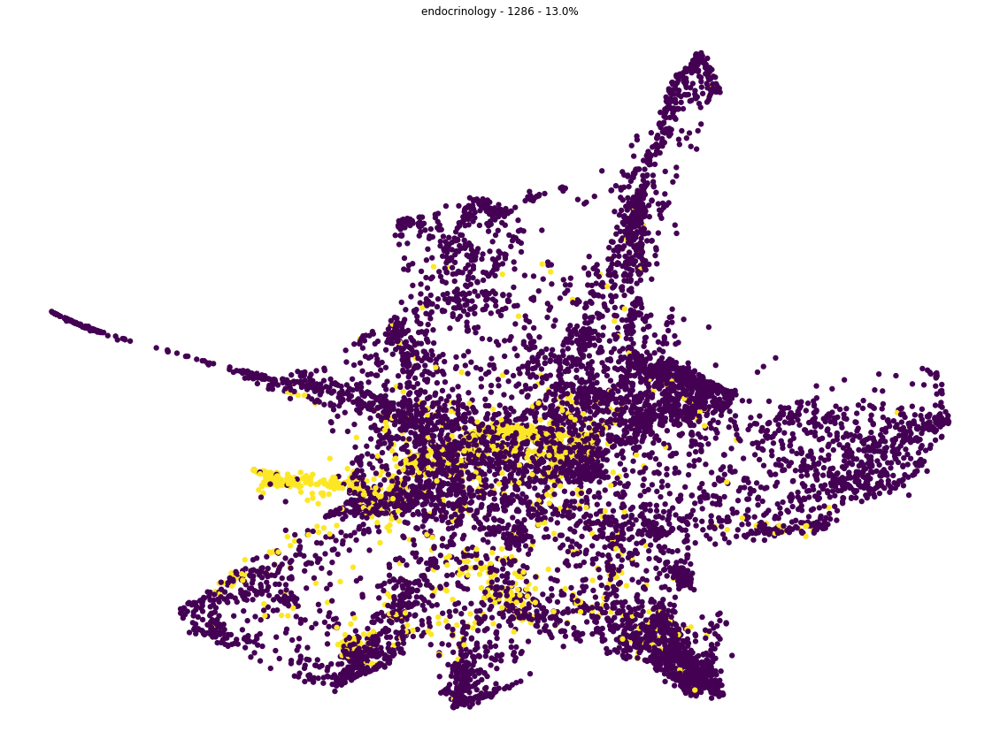

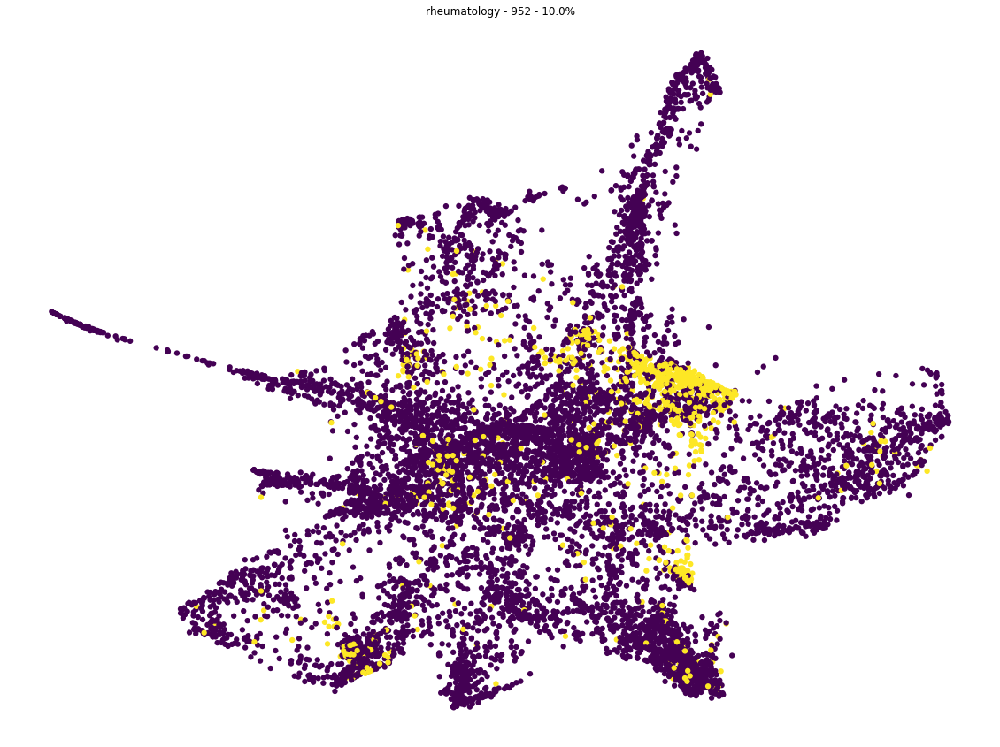

In [21]:
def FindTopic(inputTopic, top):
    if inputTopic == top:
        return 1
    else:
        return 0

topics = list(set(joinedDf.topic.tolist()))
counts = 0
for topic in topics:
    counts+=1
    joinedDf['target'] = 0
    joinedDf['target']=joinedDf['topic'].apply(lambda x: FindTopic(x, topic))
    numberOfQs = len(joinedDf.loc[joinedDf.topic==topic])
    fig= plt.figure(figsize=(20,15))
    plt.scatter(embedding[:, 0], embedding[:, 1],  
                c =  joinedDf.target.tolist() ,
                s = 40, # size
                edgecolor='none'
    )
    plt.title(topic+' - '+
              str(numberOfQs)+' - '+
              str(round(
                  100*numberOfQs/len(joinedDf), 0)
                 )+'%')
    plt.axis('off')
    fig.savefig('./figures/tfidf-umap-two-dimensions-reduced-dataset-extra-stopwords/{}-{}.png'.format(str(counts), topic))
    plt.show()